In [1]:
# imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import vgg19
from torchvision import transforms

# Question 3

## Load Dataset and View Images

In [2]:
contents = "datasets/content/" + np.array(sorted(os.listdir("datasets/content/")))
styles = "datasets/styles/" + np.array(sorted(os.listdir("datasets/styles/")))

In [3]:
def preprocess_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (400, 400))
    image = (image / 255.0).astype(float)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = (image - mean) / std
    image = np.expand_dims(image, axis=0)
    return image

In [4]:
def view_image(image, title=None):
    image = image[0]
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = image * std + mean
    image = np.clip(image, 0, 1)
    plt.imshow(image)
    if title:
        plt.title(title)
    plt.show()

In [5]:
def view_progress(progress, rate):
    num_rows = (len(progress) + 1) // 2
    plt.figure(figsize=(10, 4 * num_rows))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    for i in range(len(progress)):
        plt.subplot(num_rows, 2, i + 1)
        image = progress[i][0].detach().cpu().numpy()
        image = image * std + mean
        image = np.clip(image, 0, 1)
        plt.imshow(image)
        plt.title(f"Iteration {(i + 1) * rate}")
        plt.axis("off")
    plt.show()

## Load Model

In [6]:
model = vgg19(pretrained=True).features
for param in model.parameters():
    param.requires_grad = False
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
print(model)

/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/devika/personal/assignment-2-devika-bej/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## Feature Extraction

In [7]:
def feature_extraction(model, image):
    convs = ["0", "5", "10", "19", "21", "28"]
    features = {}
    image = image.permute(0, 3, 1, 2)
    for name, layer in model._modules.items():
        image = layer(image)
        if name in convs:
            features[name] = image
    return features
    

## Loss Functions

In [8]:
def content_loss(content_img, generated_img):
    return torch.mean((content_img - generated_img) ** 2)

In [9]:
def style_loss(style_feat, generated_feat):
    loss = 0
    for s_feat, g_feat in zip(style_feat, generated_feat):
        if s_feat == "21":
            continue
        s_gram = style_feat[s_feat]
        g_gram = generated_feat[g_feat]
        _, c, h, w = s_gram.shape
        s_gram = s_gram.view(c, h * w)
        g_gram = g_gram.view(c, h * w)
        s_gram = torch.mm(s_gram, s_gram.t())
        g_gram = torch.mm(g_gram, g_gram.t())
        factor = c * h * w
        loss += torch.mean((s_gram - g_gram) ** 2) / factor
    return loss

## Adam

In [10]:
def adam_train(content_img, style_img, model, alpha=1e3, beta=1e6, n_epochs=1000):
    content_feat = feature_extraction(model, content_img)
    style_feat = feature_extraction(model, style_img)
    generated_img = content_img.clone().to(device).requires_grad_(True)
    optimizer = optim.Adam([generated_img], 0.1)
    
    progress = []
    
    for epoch in range(n_epochs):
        generated_feat = feature_extraction(model, generated_img)
        content_l = content_loss(content_feat["21"], generated_feat["21"])
        style_l = style_loss(style_feat, generated_feat)
        loss = alpha * content_l + beta * style_l
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if (epoch + 1) % 100 == 0:
            print(f'Epoch: {epoch+1}\nContent Loss: {content_l}\nStyle Loss: {style_l}\nLoss: {loss}')
            progress.append(generated_img.detach())
    
    return generated_img, progress

## L-BFGS

In [11]:
def lbfgs_train(content_img, style_img, model, alpha=1e3, beta=1e6, n_epochs=500):
    content_feat = feature_extraction(model, content_img)
    style_feat = feature_extraction(model, style_img)
    generated_img = content_img.clone().to(device).requires_grad_(True)
    optimizer = optim.LBFGS([generated_img], max_iter=1, line_search_fn='strong_wolfe')
    
    progress = []
    
    epoch_i = [0]
    def closure():
        optimizer.zero_grad()
        generated_feat = feature_extraction(model, generated_img)
        content_l = content_loss(content_feat["21"], generated_feat["21"])
        style_l = style_loss(style_feat, generated_feat)
        loss = alpha * content_l + beta * style_l
        
        loss.backward()
        
        epoch_i[0] += 1
        if (epoch_i[0] + 1) % 100 == 0:
            print(f'Epoch: {epoch_i[0]+1}\nContent Loss: {content_l}\nStyle Loss: {style_l}\nLoss: {loss}')
            progress.append(generated_img.detach())
        
        return loss
        
    for _ in range(n_epochs):
        optimizer.step(closure)
    
    return generated_img, progress

## Test spam

In [12]:
# # test
# content = preprocess_image(contents[0])
# style = preprocess_image(styles[7])
# view_image(content)
# view_image(style)
# content = torch.from_numpy(content.astype(np.float32)).to(device)
# style = torch.from_numpy(style.astype(np.float32)).to(device)
# combined, progress = lbfgs_train(content, style, model)

In [13]:
# view_image(combined.detach().cpu().numpy())

In [14]:
# view_progress(progress, 100)

## Test Function

In [15]:
def test(content, style, alpha=1e3, beta=1e6):
    view_image(content)
    view_image(style)
    content = torch.from_numpy(content.astype(np.float32)).to(device)
    style = torch.from_numpy(style.astype(np.float32)).to(device)
    
    print("Adam")
    combined, progress = adam_train(content, style, model, alpha=alpha, beta=beta)
    view_image(combined.detach().cpu().numpy())
    view_progress(progress, 100)
    
    print("L-BFGS")
    combined, progress = lbfgs_train(content, style, model, alpha=alpha, beta=beta)
    view_image(combined.detach().cpu().numpy())
    view_progress(progress, 100)

## Combination 1

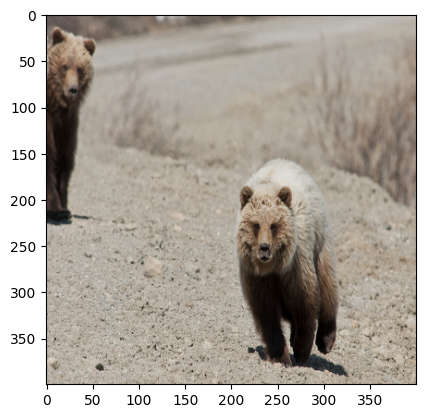

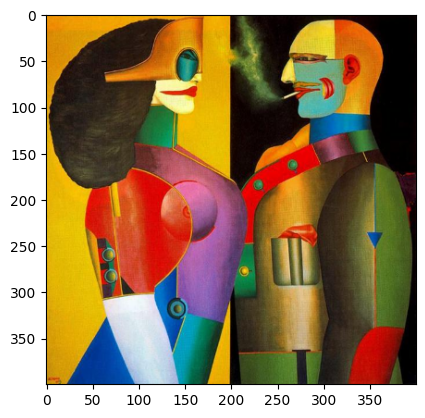

Adam
Epoch: 100
Content Loss: 14.358407020568848
Style Loss: 32.394710540771484
Loss: 32409068.0
Epoch: 200
Content Loss: 14.930109024047852
Style Loss: 16.304197311401367
Loss: 16319127.0
Epoch: 300
Content Loss: 15.127584457397461
Style Loss: 12.430071830749512
Loss: 12445200.0
Epoch: 400
Content Loss: 14.692870140075684
Style Loss: 9.65147590637207
Loss: 9666169.0
Epoch: 500
Content Loss: 15.139605522155762
Style Loss: 8.634140014648438
Loss: 8649280.0
Epoch: 600
Content Loss: 14.893157005310059
Style Loss: 8.221522331237793
Loss: 8236415.5
Epoch: 700
Content Loss: 15.330638885498047
Style Loss: 6.667219638824463
Loss: 6682550.0
Epoch: 800
Content Loss: 14.703350067138672
Style Loss: 8.975419998168945
Loss: 8990123.0
Epoch: 900
Content Loss: 15.039383888244629
Style Loss: 6.466638565063477
Loss: 6481678.0
Epoch: 1000
Content Loss: 15.736952781677246
Style Loss: 7.218254566192627
Loss: 7233991.5


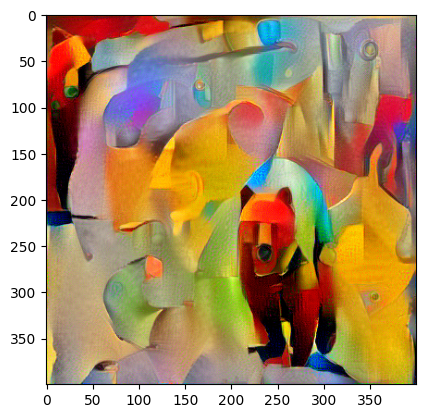

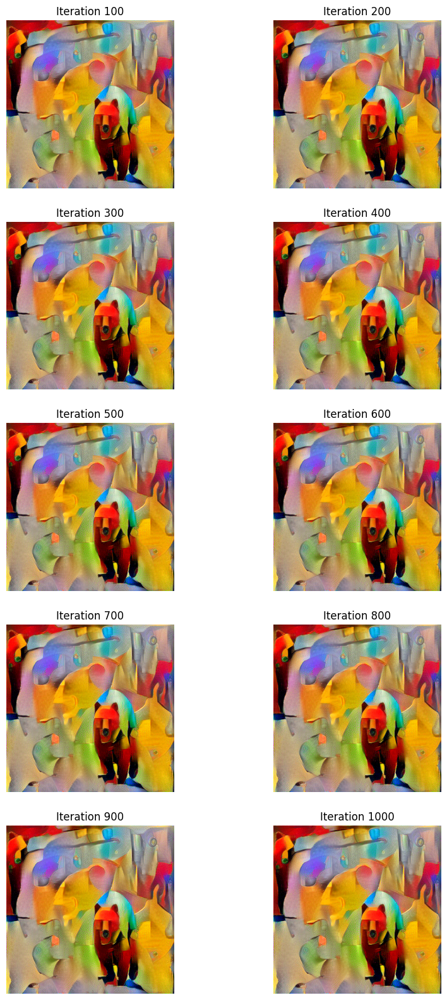

L-BFGS
Epoch: 100
Content Loss: 13.770936965942383
Style Loss: 72.81938934326172
Loss: 72833160.0
Epoch: 200
Content Loss: 14.31048583984375
Style Loss: 28.6445369720459
Loss: 28658846.0
Epoch: 300
Content Loss: 14.73847770690918
Style Loss: 15.200311660766602
Loss: 15215050.0
Epoch: 400
Content Loss: 14.99138069152832
Style Loss: 10.110753059387207
Loss: 10125744.0
Epoch: 500
Content Loss: 15.138507843017578
Style Loss: 7.347687244415283
Loss: 7362825.5
Epoch: 600
Content Loss: 15.309182167053223
Style Loss: 5.634418964385986
Loss: 5649728.0
Epoch: 700
Content Loss: 15.422181129455566
Style Loss: 4.494636058807373
Loss: 4510058.0
Epoch: 800
Content Loss: 15.537224769592285
Style Loss: 3.6981492042541504
Loss: 3713686.5
Epoch: 900
Content Loss: 15.577178001403809
Style Loss: 3.137964963912964
Loss: 3153542.25
Epoch: 1000
Content Loss: 15.663497924804688
Style Loss: 2.721587896347046
Loss: 2737251.5


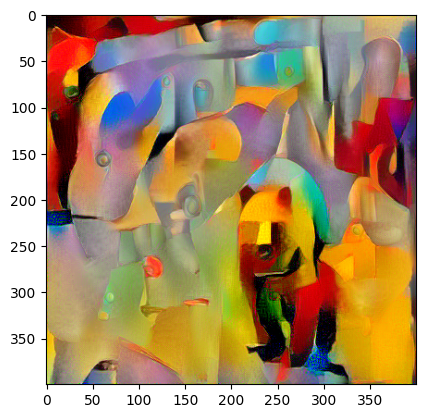

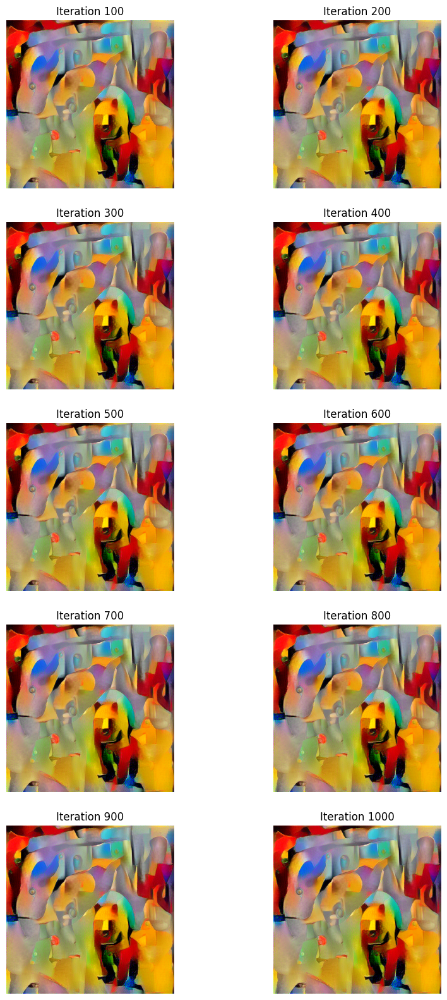

In [16]:
test(preprocess_image(contents[0]), preprocess_image(styles[7]))

## Combination 2

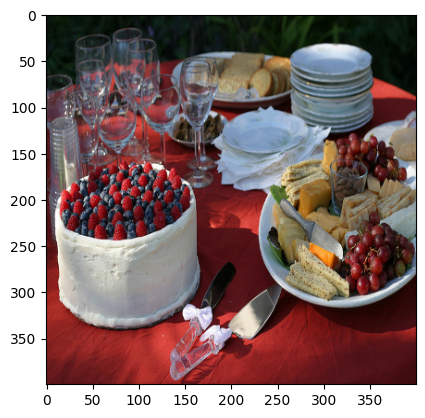

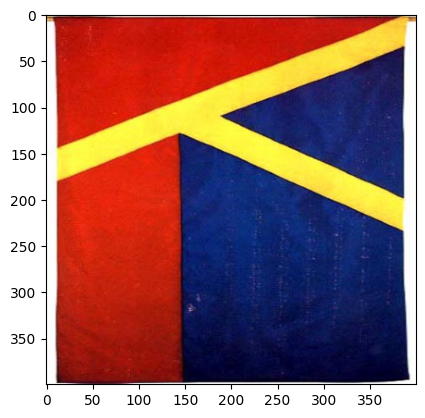

Adam
Epoch: 100
Content Loss: 17.554521560668945
Style Loss: 35.27490234375
Loss: 35292460.0
Epoch: 200
Content Loss: 18.39501190185547
Style Loss: 20.100173950195312
Loss: 20118570.0
Epoch: 300
Content Loss: 18.861927032470703
Style Loss: 15.68933391571045
Loss: 15708196.0
Epoch: 400
Content Loss: 19.101280212402344
Style Loss: 14.09644889831543
Loss: 14115550.0
Epoch: 500
Content Loss: 19.428678512573242
Style Loss: 8.384549140930176
Loss: 8403978.0
Epoch: 600
Content Loss: 19.575471878051758
Style Loss: 8.43716812133789
Loss: 8456743.0
Epoch: 700
Content Loss: 19.627948760986328
Style Loss: 12.304953575134277
Loss: 12324582.0
Epoch: 800
Content Loss: 19.64838409423828
Style Loss: 13.256437301635742
Loss: 13276085.0
Epoch: 900
Content Loss: 19.815940856933594
Style Loss: 6.744069576263428
Loss: 6763885.5
Epoch: 1000
Content Loss: 19.856943130493164
Style Loss: 6.811093807220459
Loss: 6830951.0


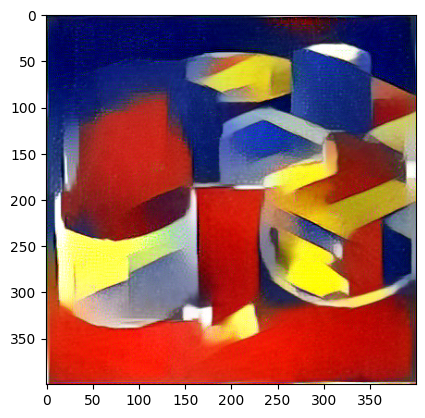

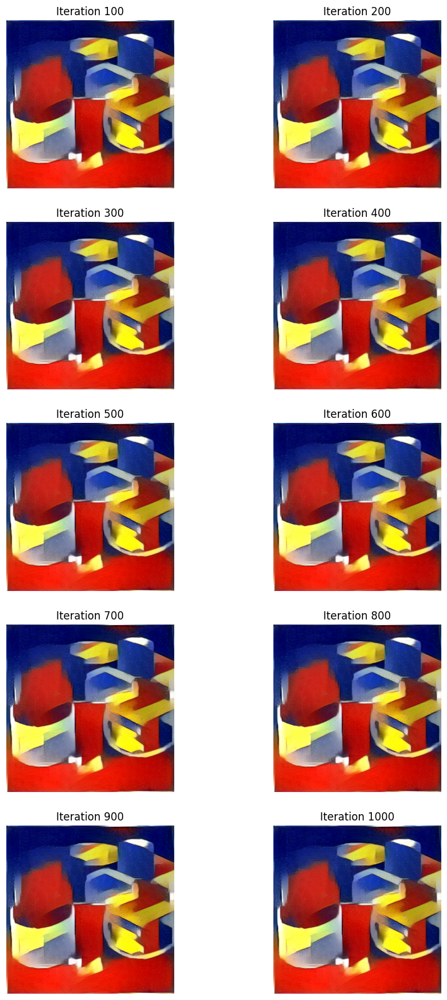

L-BFGS
Epoch: 100
Content Loss: 16.63872528076172
Style Loss: 61.50834274291992
Loss: 61524984.0
Epoch: 200
Content Loss: 17.88133430480957
Style Loss: 23.671689987182617
Loss: 23689572.0
Epoch: 300
Content Loss: 18.666837692260742
Style Loss: 13.399784088134766
Loss: 13418451.0
Epoch: 400
Content Loss: 19.02768898010254
Style Loss: 8.831753730773926
Loss: 8850782.0
Epoch: 500
Content Loss: 19.229583740234375
Style Loss: 6.590200901031494
Loss: 6609430.5
Epoch: 600
Content Loss: 19.429170608520508
Style Loss: 5.150534629821777
Loss: 5169963.5
Epoch: 700
Content Loss: 19.549694061279297
Style Loss: 4.180711269378662
Loss: 4200261.0
Epoch: 800
Content Loss: 19.642555236816406
Style Loss: 3.4936814308166504
Loss: 3513324.0
Epoch: 900
Content Loss: 19.712793350219727
Style Loss: 3.0482614040374756
Loss: 3067974.25
Epoch: 1000
Content Loss: 19.77846908569336
Style Loss: 2.7401134967803955
Loss: 2759892.0


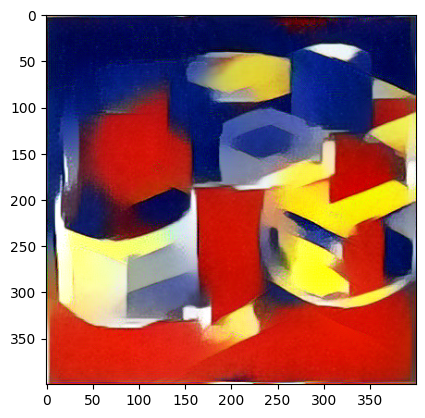

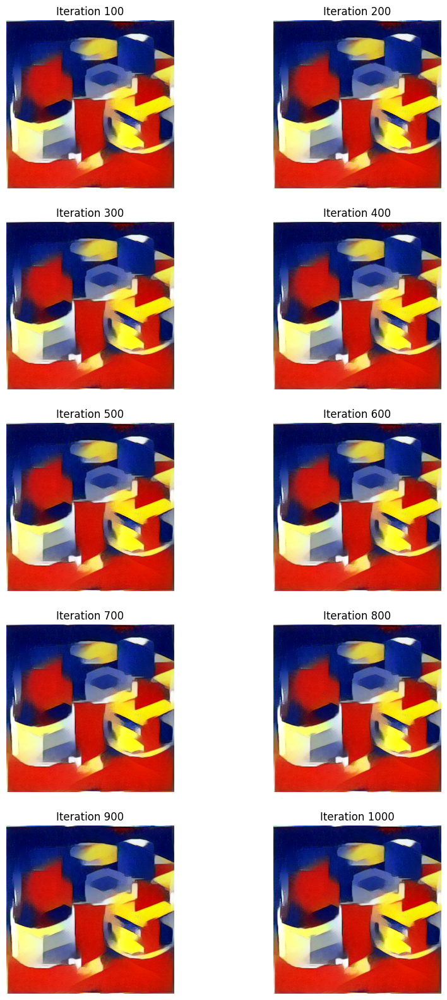

In [ ]:
test(preprocess_image(contents[7]), preprocess_image(styles[1]), alpha=1e7)

## Combination 3

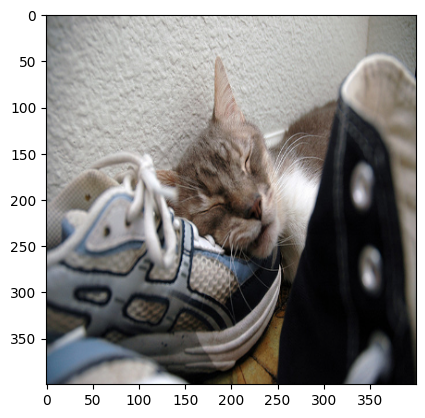

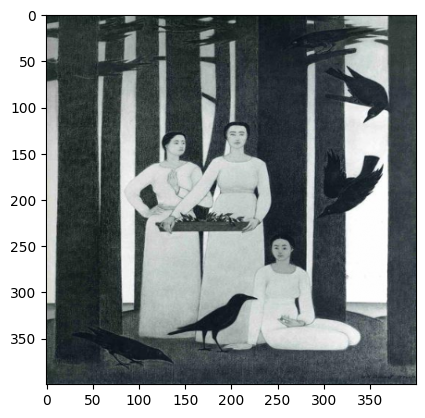

Adam
Epoch: 100
Content Loss: 7.59161376953125
Style Loss: 3.9483096599578857
Loss: 3955901.25
Epoch: 200
Content Loss: 7.899393558502197
Style Loss: 3.1934306621551514
Loss: 3201330.25
Epoch: 300
Content Loss: 8.26172924041748
Style Loss: 2.5043530464172363
Loss: 2512614.75
Epoch: 400
Content Loss: 8.283452987670898
Style Loss: 2.452033758163452
Loss: 2460317.25
Epoch: 500
Content Loss: 8.459223747253418
Style Loss: 2.1866953372955322
Loss: 2195154.5
Epoch: 600
Content Loss: 8.475996017456055
Style Loss: 2.19647216796875
Loss: 2204948.25
Epoch: 700
Content Loss: 8.454452514648438
Style Loss: 2.5836181640625
Loss: 2592072.75
Epoch: 800
Content Loss: 8.748452186584473
Style Loss: 2.1367642879486084
Loss: 2145512.75
Epoch: 900
Content Loss: 8.539201736450195
Style Loss: 2.3508388996124268
Loss: 2359378.25
Epoch: 1000
Content Loss: 8.501936912536621
Style Loss: 2.278275728225708
Loss: 2286777.75


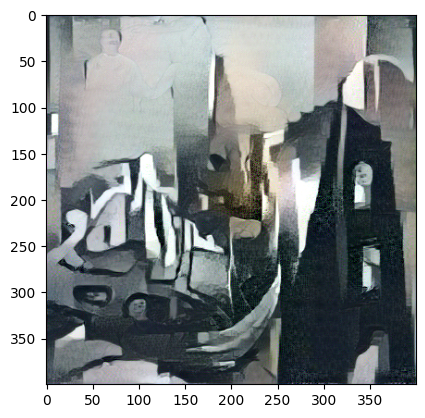

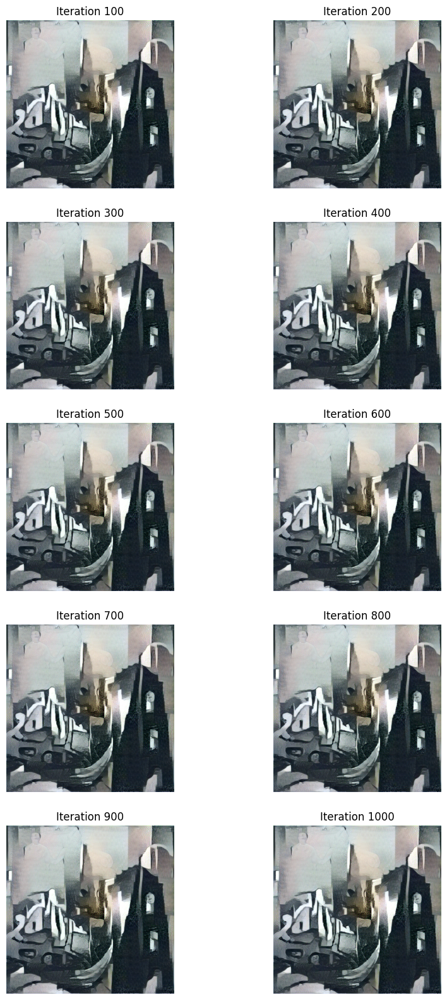

L-BFGS
Epoch: 100
Content Loss: 6.607125759124756
Style Loss: 7.0617451667785645
Loss: 7068352.0
Epoch: 200
Content Loss: 7.466054439544678
Style Loss: 2.834209680557251
Loss: 2841675.75
Epoch: 300
Content Loss: 7.893510818481445
Style Loss: 1.7232937812805176
Loss: 1731187.25
Epoch: 400
Content Loss: 8.106282234191895
Style Loss: 1.2592365741729736
Loss: 1267342.875
Epoch: 500
Content Loss: 8.248804092407227
Style Loss: 1.0045967102050781
Loss: 1012845.5
Epoch: 600
Content Loss: 8.368202209472656
Style Loss: 0.8288201689720154
Loss: 837188.375
Epoch: 700
Content Loss: 8.464149475097656
Style Loss: 0.714345395565033
Loss: 722809.5
Epoch: 800
Content Loss: 8.545450210571289
Style Loss: 0.6250207424163818
Loss: 633566.1875
Epoch: 900
Content Loss: 8.620109558105469
Style Loss: 0.5583834052085876
Loss: 567003.5
Epoch: 1000
Content Loss: 8.679455757141113
Style Loss: 0.5033078789710999
Loss: 511987.34375


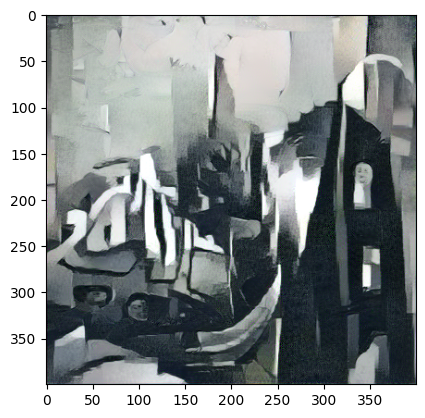

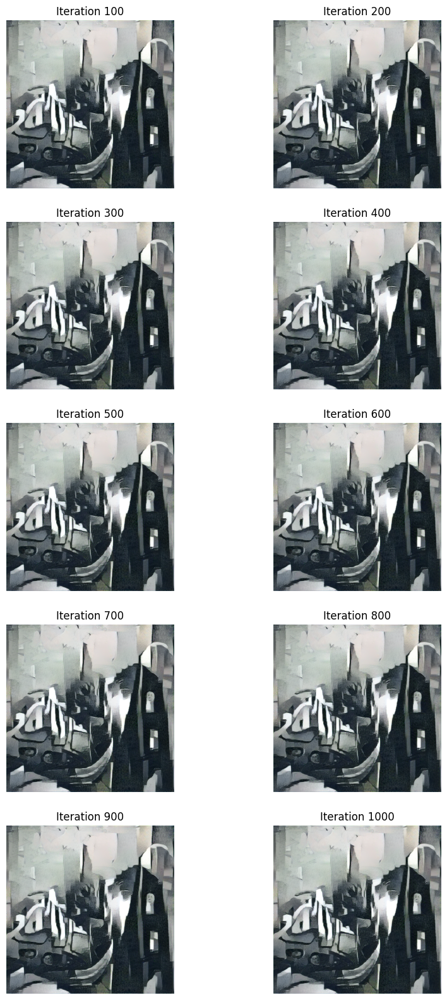

In [18]:
test(preprocess_image(contents[3]), preprocess_image(styles[5]))

## Combination 4

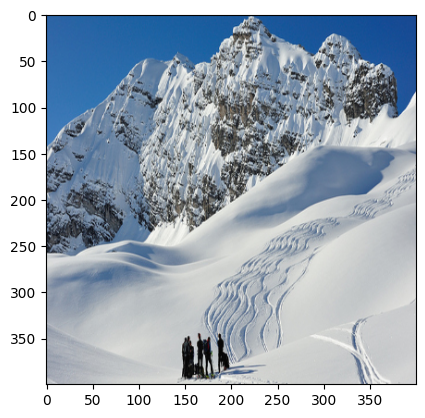

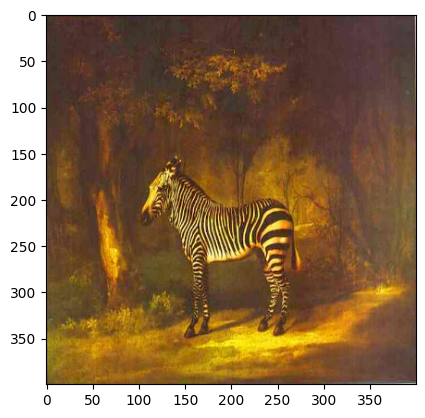

Adam
Epoch: 100
Content Loss: 9.346900939941406
Style Loss: 11.369673728942871
Loss: 11379021.0
Epoch: 200
Content Loss: 9.761579513549805
Style Loss: 5.22476053237915
Loss: 5234522.0
Epoch: 300
Content Loss: 9.731886863708496
Style Loss: 3.231822967529297
Loss: 3241555.0
Epoch: 400
Content Loss: 9.970292091369629
Style Loss: 2.359022855758667
Loss: 2368993.0
Epoch: 500
Content Loss: 9.934616088867188
Style Loss: 2.6220860481262207
Loss: 2632020.5
Epoch: 600
Content Loss: 9.94067096710205
Style Loss: 1.5347697734832764
Loss: 1544710.375
Epoch: 700
Content Loss: 10.098464012145996
Style Loss: 1.7163907289505005
Loss: 1726489.25
Epoch: 800
Content Loss: 10.057427406311035
Style Loss: 1.2410352230072021
Loss: 1251092.625
Epoch: 900
Content Loss: 10.196307182312012
Style Loss: 2.5302464962005615
Loss: 2540442.75
Epoch: 1000
Content Loss: 10.162796020507812
Style Loss: 1.036724328994751
Loss: 1046887.125


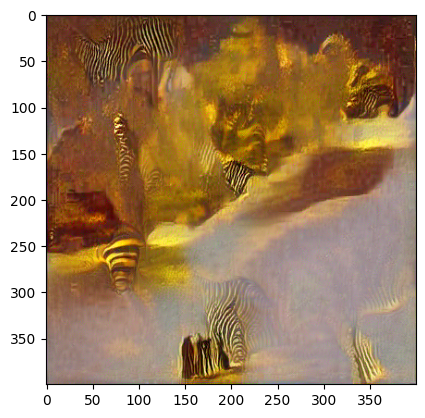

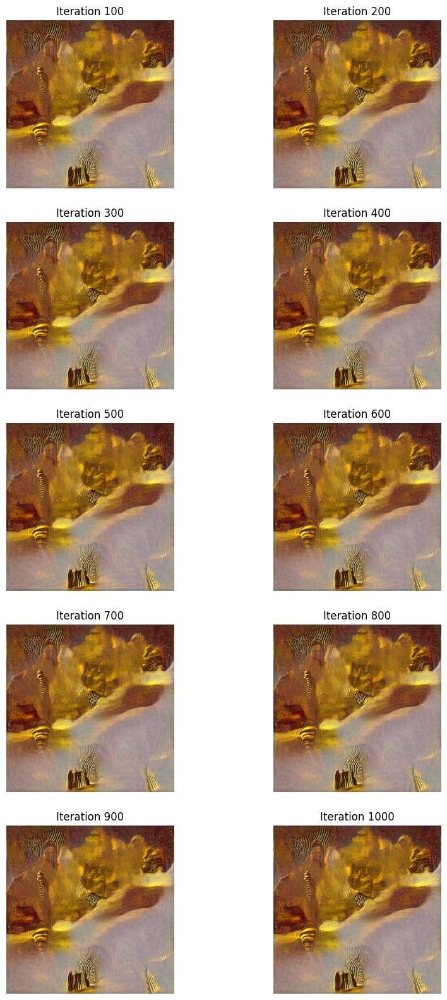

L-BFGS
Epoch: 100
Content Loss: 9.319303512573242
Style Loss: 14.0314302444458
Loss: 14040749.0
Epoch: 200
Content Loss: 9.867338180541992
Style Loss: 5.0875115394592285
Loss: 5097379.0
Epoch: 300
Content Loss: 10.06396198272705
Style Loss: 2.557664632797241
Loss: 2567728.75
Epoch: 400
Content Loss: 10.183287620544434
Style Loss: 1.6240434646606445
Loss: 1634226.75
Epoch: 500
Content Loss: 10.2255859375
Style Loss: 1.1541261672973633
Loss: 1164351.75
Epoch: 600
Content Loss: 10.258085250854492
Style Loss: 0.8878405094146729
Loss: 898098.5625
Epoch: 700
Content Loss: 10.278700828552246
Style Loss: 0.7236775159835815
Loss: 733956.1875
Epoch: 800
Content Loss: 10.293229103088379
Style Loss: 0.5991177558898926
Loss: 609411.0
Epoch: 900
Content Loss: 10.31602668762207
Style Loss: 0.5046550631523132
Loss: 514971.09375
Epoch: 1000
Content Loss: 10.340500831604004
Style Loss: 0.4186205267906189
Loss: 428961.03125


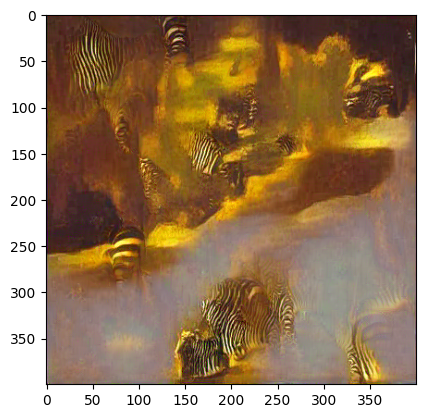

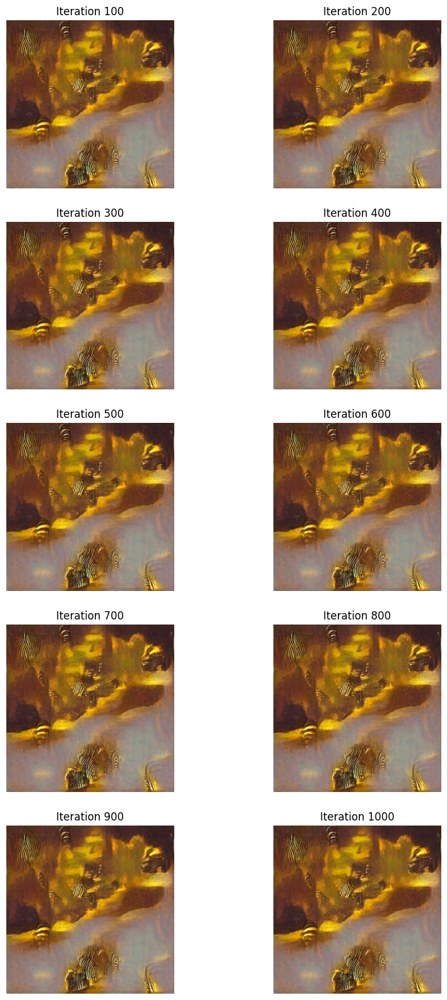

In [20]:
test(preprocess_image(contents[6]), preprocess_image(styles[9]))

## Combination 5

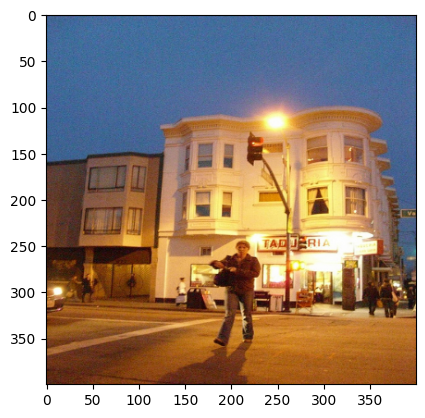

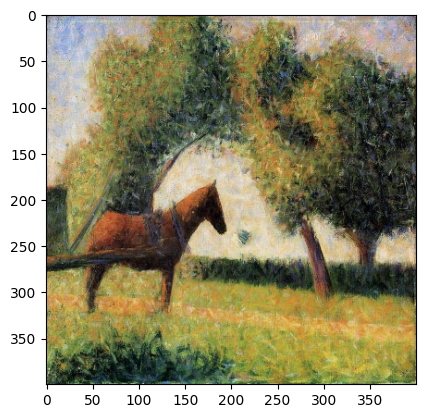

Adam
Epoch: 100
Content Loss: 11.720145225524902
Style Loss: 0.8004672527313232
Loss: 812187.375
Epoch: 200
Content Loss: 11.883681297302246
Style Loss: 0.47803619503974915
Loss: 489919.875
Epoch: 300
Content Loss: 11.901150703430176
Style Loss: 0.34963592886924744
Loss: 361537.09375
Epoch: 400
Content Loss: 11.834406852722168
Style Loss: 0.4728456139564514
Loss: 484680.03125
Epoch: 500
Content Loss: 12.000443458557129
Style Loss: 0.5234936475753784
Loss: 535494.125
Epoch: 600
Content Loss: 11.905241966247559
Style Loss: 0.3823353946208954
Loss: 394240.65625
Epoch: 700
Content Loss: 12.01305103302002
Style Loss: 0.19244498014450073
Loss: 204458.03125
Epoch: 800
Content Loss: 12.023329734802246
Style Loss: 0.20437459647655487
Loss: 216397.921875
Epoch: 900
Content Loss: 11.897679328918457
Style Loss: 0.47035637497901917
Loss: 482254.0625
Epoch: 1000
Content Loss: 12.256505966186523
Style Loss: 0.635529100894928
Loss: 647785.625


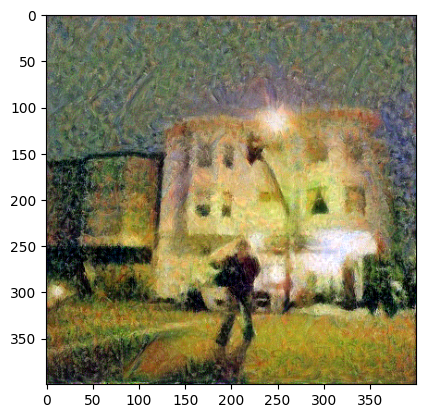

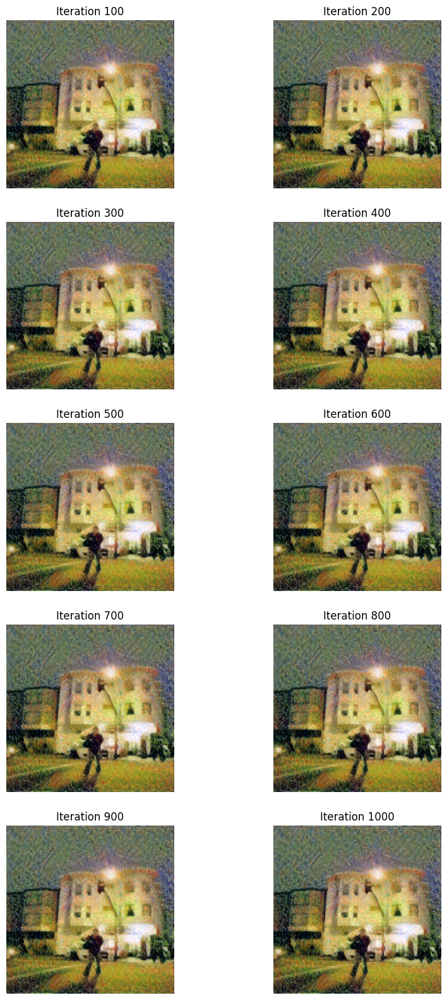

L-BFGS
Epoch: 100
Content Loss: 11.127433776855469
Style Loss: 1.3977020978927612
Loss: 1408829.5


In [ ]:
test(preprocess_image(contents[9]), preprocess_image(styles[3]))

## Report

- L-BFGS has lower total loss compared to Adam i.e L-BFGS is better at minimizing loss function
- L-BFGS lowers the style loss more than Adam, while content loss is comparable between both
- L-BFGS has cleaner results than Adam, but also loses a lot of the structure from the content image
- Adam converges slower than L-BFGS, owing to first-order optimization
- Alpha:Beta ratio follows the results of the paper with the ideal ratio being 1e-3 or 1e-4
- Style transfer fails on images with too much structure or noise